In [1]:
!pwd

/reg/data/ana03/scratch/cwang31/pf


In [2]:
# Load paths for using psana
%env SIT_ROOT=/reg/g/psdm/
%env SIT_DATA=/cds/group/psdm/data/
%env SIT_PSDM_DATA=/cds/data/psdm/

env: SIT_ROOT=/reg/g/psdm/
env: SIT_DATA=/cds/group/psdm/data/
env: SIT_PSDM_DATA=/cds/data/psdm/


In [3]:
import os
import torch
import random
import numpy as np
import h5py
import time

from peaknet.methods.att_unet   import AttentionUNet
from peaknet.model              import ConfigPeakFinderModel, PeakFinderModel
from peaknet.datasets.utils     import PsanaImg
from peaknet.datasets.transform import center_crop, coord_crop_to_img

from cupyx.scipy import ndimage
import cupy as cp

seed = 0

In [4]:
import torch.nn.functional as F

In [5]:
import matplotlib.pyplot as plt
import matplotlib.colors       as mcolors
import matplotlib.patches      as mpatches
import matplotlib.transforms   as mtransforms
%matplotlib inline

## Load psana for accessing image data

In [40]:
# Sample Rayonix dataset
exp           = 'mfxp22820'
run           = 13
img_load_mode = 'calib'
access_mode   = 'idx'
detector_name = 'Rayonix'
photon_energy = 9.54e3    # eV
encoder_value = -196

psana_img = PsanaImg(exp, run, access_mode, detector_name)

In [6]:
# Sample Rayonix dataset
exp           = 'mfx13016'
# run           = 28
run           = 37
run           = 38
img_load_mode = 'calib'
access_mode   = 'idx'
detector_name = 'Rayonix'
# photon_energy = 9.54e3    # eV
# encoder_value = -196

psana_img = PsanaImg(exp, run, access_mode, detector_name)

In [ ]:
# Load the global mask...
path_mask_gloabl = "label/global_mask.Rayonix.2023_0328_1117_28.v2.npy"
mask_global = np.load(path_mask_gloabl)


## Load Model

In [ ]:
timestamp = "2023_0404_1645_58"    # lam = 10.0
epoch = 226
fl_chkpt = None if timestamp is None else f"{timestamp}.epoch_{epoch}.chkpt"

uses_skip_connection = False

In [ ]:
timestamp = "2023_0405_1618_16"
epoch = 57
fl_chkpt = None if timestamp is None else f"{timestamp}.epoch_{epoch}.chkpt"

uses_skip_connection = False

In [ ]:
timestamp = "2023_0405_1809_07"
epoch = 121
fl_chkpt = None if timestamp is None else f"{timestamp}.epoch_{epoch}.chkpt"

uses_skip_connection = True

In [ ]:
timestamp = "2023_0405_2341_24"
epoch = 109
fl_chkpt = None if timestamp is None else f"{timestamp}.epoch_{epoch}.chkpt"

uses_skip_connection = True

In [ ]:
timestamp = "2023_0405_2340_13"
epoch = 110
fl_chkpt = None if timestamp is None else f"{timestamp}.epoch_{epoch}.chkpt"

uses_skip_connection = True

In [ ]:
timestamp = "2023_0406_1122_55"    # 1000 examples
# epoch = 57
# epoch = 286
# epoch = 353
# epoch = 461
epoch = 581
fl_chkpt = None if timestamp is None else f"{timestamp}.epoch_{epoch}.chkpt"

uses_skip_connection = True
# uses_skip_connection = False

In [ ]:
timestamp = "2023_0408_1106_35"
epoch = 288
fl_chkpt = None if timestamp is None else f"{timestamp}.epoch_{epoch}.chkpt"

uses_skip_connection = False

In [10]:
timestamp = "2023_0416_0011_17"
timestamp = "test"
epoch = 136
fl_chkpt = None if timestamp is None else f"{timestamp}.epoch_{epoch}.chkpt"

uses_skip_connection = True

In [11]:
base_channels = 8
focal_alpha   = 1.2
focal_gamma   = 2.0
method = AttentionUNet( base_channels        = base_channels,
                        in_channels          = 1,
                        out_channels         = 3,
                        uses_skip_connection = uses_skip_connection,
                        att_gate_channels    = None, )
config_peakfinder = ConfigPeakFinderModel( method = method,  
                                           focal_alpha = focal_alpha,
                                           focal_gamma = focal_gamma, )
model = PeakFinderModel(config_peakfinder)
model.init_params()    # ..., load random weights 

In [12]:
# model.init_params(from_timestamp = timestamp)   # Run this will load a trained model
model.init_params(fl_chkpt = fl_chkpt)   # Run this will load a trained model

In [13]:
# Load model to gpus if available...
device = torch.cuda.current_device() if torch.cuda.is_available() else 'cpu'
model  = torch.nn.DataParallel(model.method).to(device)

## Define hooks (Optional)

This is for for printing the metadata of the underlying neural networks.

In [ ]:
# Define hooks...
activation_dict = {}
preactivation_dict = {}
def get_activation(name, tag = ''):
    if tag not in preactivation_dict: preactivation_dict[tag] = {}
    if tag not in activation_dict: activation_dict[tag] = {}
    def hook(model, input, output):
        preactivation_dict[tag][name] = input
        activation_dict[tag][name] = output
    return hook

# Define what layer you want to check...
for name, layer in model.named_modules():
    if isinstance(layer, torch.nn.ReLU):
        layer.register_forward_hook(get_activation(name, 'relu'))

    if "final_conv" in name:
        layer.register_forward_hook(get_activation(name, 'final_conv'))

In [ ]:
# # Check out the shape of the output in each layer...
# class ReLUShapePrinter:
#     def __call__(self, module, input, output):
#         if isinstance(module, torch.nn.ReLU):
#             print(f"{module.__class__.__name__} output shape: {output.shape}")
            
# # Register the shape printer on each layer
# for name, module in model.named_modules():
#     module.register_forward_hook(ReLUShapePrinter())
            
# Check out the shape of the output in each layer...
class NonReLUShapePrinter:
    def __call__(self, module, input, output):
        if not isinstance(module, torch.nn.ReLU):
            print(f"{module.__class__.__name__} output shape: {output.shape}")

# Register the shape printer on each layer
for name, module in model.named_modules():
    module.register_forward_hook(NonReLUShapePrinter())

In [ ]:
img.shape

### Example of finding peaks in one image (access by event)

In [48]:
# Load images by event...
# event = 5735
event = 3101
# event = 1907
# event = 7619
# event = 12719
# event = 9351
# event = 2771
# event = 1581
# event = 2807
img   = psana_img.get(event, None, 'calib')

# img *= mask_global[0]

offset = 10
size_y, size_x = img.shape
xmin = 0 + offset
xmax = size_x - offset
ymin = 0 + offset
ymax = size_y - offset
mask_select = np.zeros_like(img)
mask_select[ymin:ymax, xmin:xmax] = 1.0
img *= mask_select
# img = img[ymin:ymax, xmin:xmax]

img = torch.tensor(img).type(dtype=torch.float)[None,None,].to(device)
img = (img - img.mean()) / img.std()

model.eval()
time_start = time.monotonic()
with torch.no_grad():
    fmap = model.forward(img)
mask_predicted = fmap.softmax(dim = 1)
time_end = time.monotonic()
print(f"Elapsed: {(time_end - time_start) * 1e3} ms.")

# mask_predicted = mask_predicted[0, 0]
# mask_predicted = mask_predicted.cpu().detach().numpy()

# B, C, H, W = mask_predicted.shape
# mask_predicted = mask_predicted.argmax(dim = 1, keepdims = True)
# mask_predicted = F.one_hot(mask_predicted.reshape(B, -1)).permute(0, 2, 1).reshape(B, -1, H, W)

label_predicted = mask_predicted[0][1]
bg_predicted = mask_predicted[0][0]
sc_predicted = mask_predicted[0][2]
label_predicted = label_predicted.cpu().detach().numpy()
bg_predicted = bg_predicted.cpu().detach().numpy()
sc_predicted = sc_predicted.cpu().detach().numpy()

Elapsed: 9.17398277670145 ms.


(0.0, 1.0, dtype('float32'))

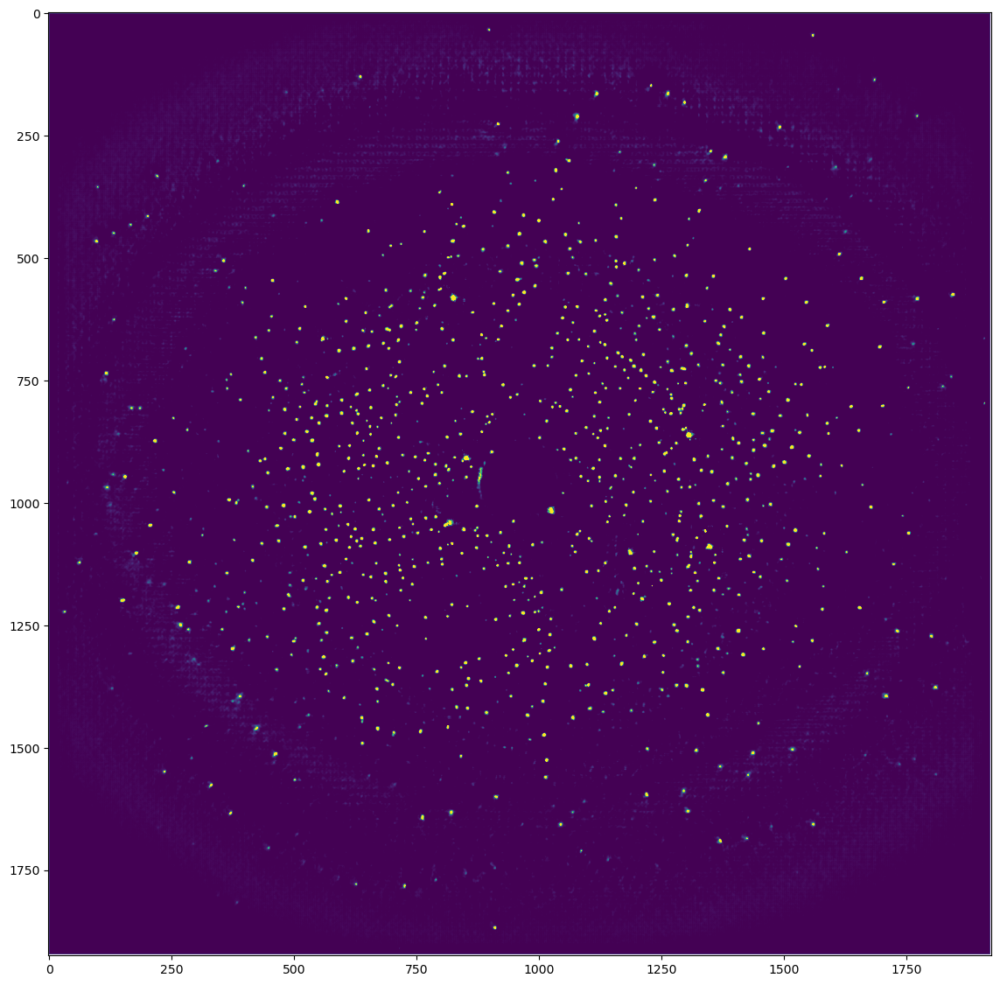

In [49]:
offset = 4
b_offset = 2
size_y, size_x = label_predicted.shape[-2:]
y_bmin, x_bmin = 0, 0
y_bmax, x_bmax = size_y, size_x

scale = 1

# [[[ Visual ]]]
# Set up the visual
ncols = 1
nrows = 1
fig   = plt.figure(figsize = (16*scale,14*scale))
gspec = fig.add_gridspec( nrows, ncols,
                          width_ratios  = [1],
                          height_ratios = [1,], 
                        )
ax_list = [ fig.add_subplot(gspec[0, 0], aspect = 1),  ]

# Plot image
data = label_predicted
vmin = np.mean(data) - 0 * data.std()
vmax = np.mean(data) + 6 * data.std()
im = ax_list[0].imshow(data, vmin = 0, vmax = 1)
im.set_clim(vmin, vmax)
ax_list[0].set_xlim([x_bmin - b_offset, x_bmax + b_offset])
ax_list[0].set_ylim([y_bmin - b_offset, y_bmax + b_offset])
ax_list[0].invert_yaxis()
data.min(), data.max(), data.dtype

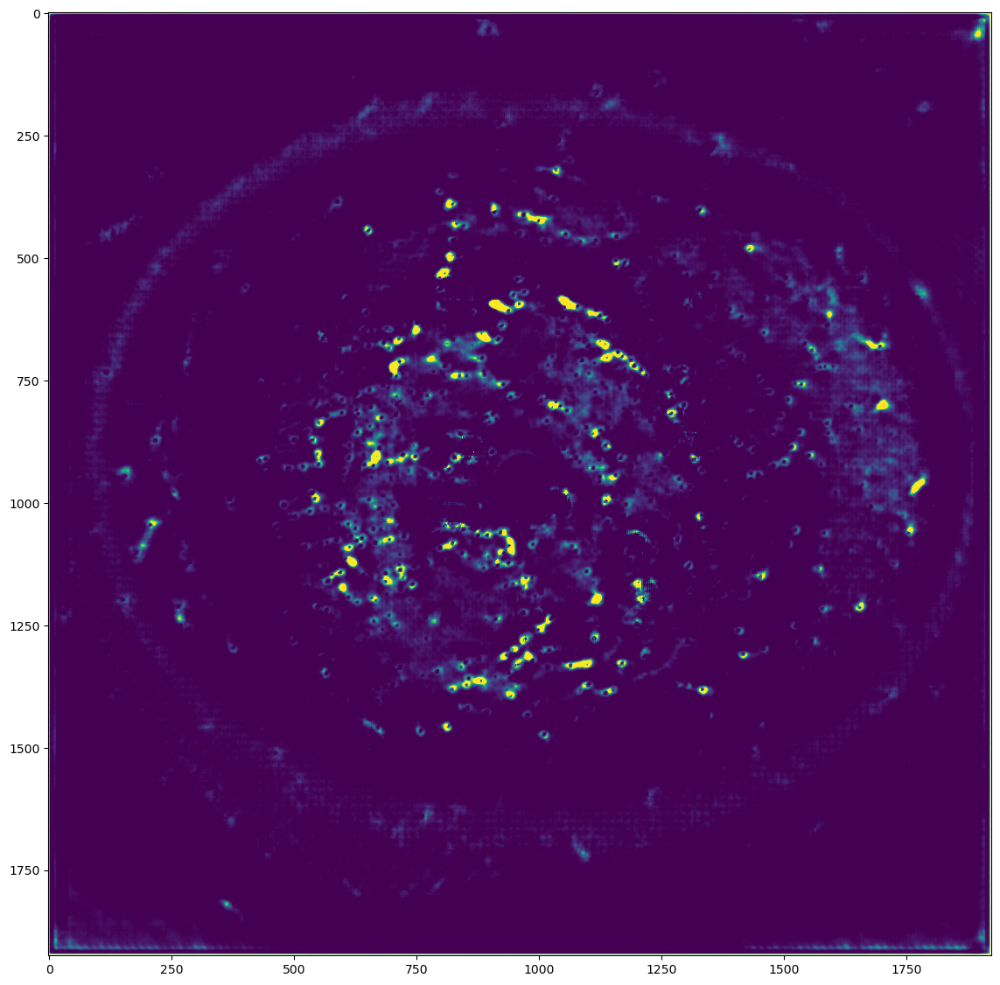

In [50]:
scale = 1

# [[[ Visual ]]]
# Set up the visual
ncols = 1
nrows = 1
fig   = plt.figure(figsize = (16*scale,14*scale))
gspec = fig.add_gridspec( nrows, ncols,
                          width_ratios  = [1],
                          height_ratios = [1,], 
                        )
ax_list = [ fig.add_subplot(gspec[0, 0], aspect = 1),  ]

# Plot image
data = sc_predicted
vmin = np.mean(data) - 0 * data.std()
vmax = np.mean(data) + 6 * data.std()
im = ax_list[0].imshow(data, vmin = 0, vmax = 1)
im.set_clim(vmin, vmax)
ax_list[0].set_xlim([x_bmin - b_offset, x_bmax + b_offset])
ax_list[0].set_ylim([y_bmin - b_offset, y_bmax + b_offset])
ax_list[0].invert_yaxis()

(7.559293e-15, 1.0, dtype('float32'))

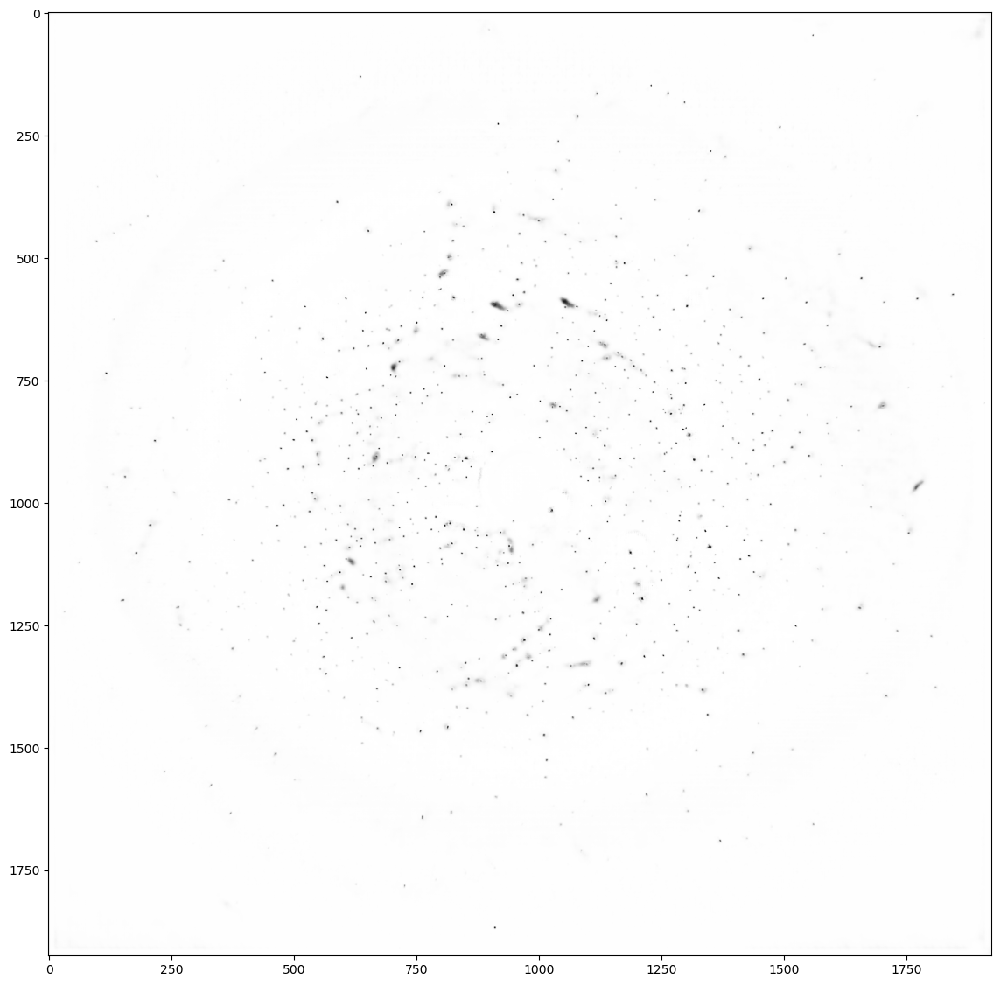

In [51]:
scale = 1

# [[[ Visual ]]]
# Set up the visual
ncols = 1
nrows = 1
fig   = plt.figure(figsize = (16*scale,14*scale))
gspec = fig.add_gridspec( nrows, ncols,
                          width_ratios  = [1],
                          height_ratios = [1,], 
                        )
ax_list = [ fig.add_subplot(gspec[0, 0], aspect = 1),  ]

# Plot image
data = bg_predicted
vmin = np.mean(data) - 0 * data.std()
vmax = np.mean(data) + 6 * data.std()
im = ax_list[0].imshow(data, vmin = 0, vmax = 1, cmap = "Greys_r")
# im.set_clim(vmin, vmax)
ax_list[0].set_xlim([x_bmin - b_offset, x_bmax + b_offset])
ax_list[0].set_ylim([y_bmin - b_offset, y_bmax + b_offset])
ax_list[0].invert_yaxis()
data.min(), data.max(), data.dtype

Elapsed: 9.487975854426622 ms.


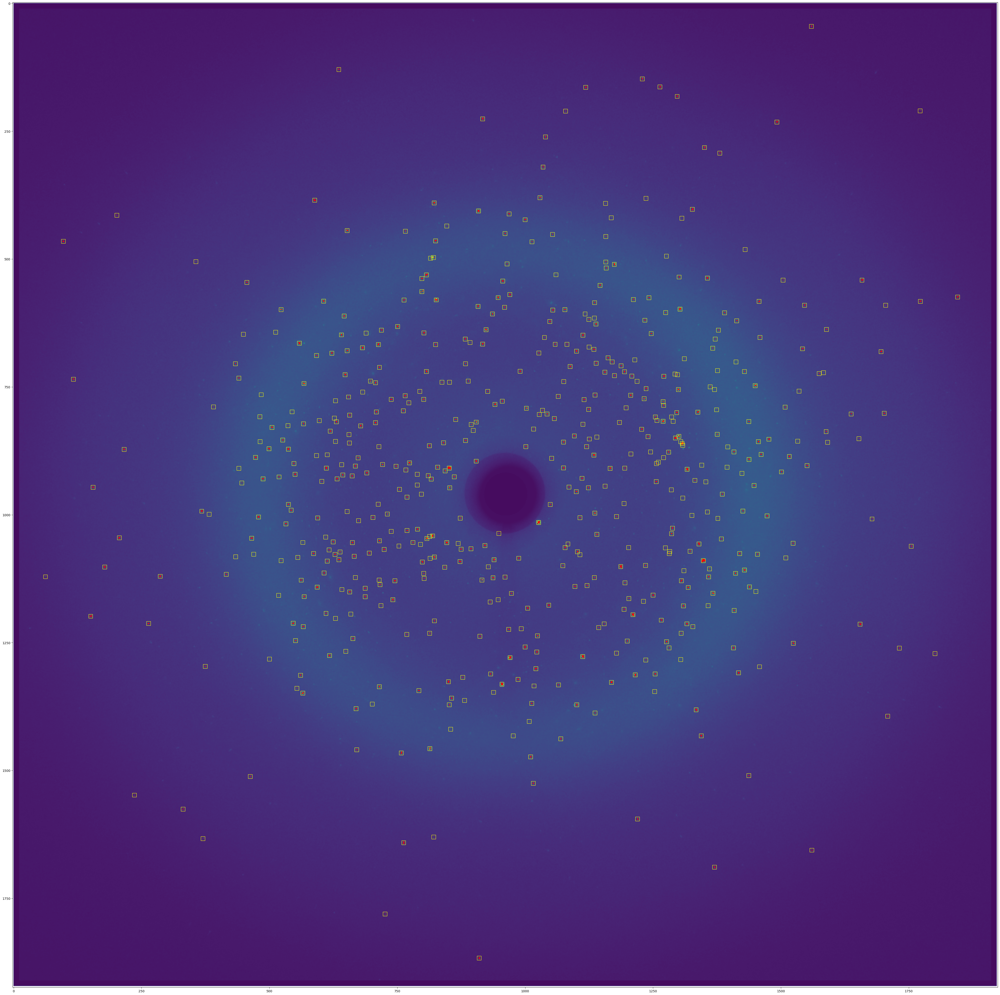

In [47]:
scale = 4

# Load images by event...
# event = 5735
event = 3101
# event = 1907
# event = 7619
# event = 12719
# event = 12723
# event = 9351
# event = 2771
# event = 1581
# event = 2807
# event = 3007
img   = psana_img.get(event, None, 'calib')

offset = 10
size_y, size_x = img.shape
xmin = 0 + offset
xmax = size_x - offset
ymin = 0 + offset
ymax = size_y - offset
mask_select = np.zeros_like(img)
mask_select[ymin:ymax, xmin:xmax] = 1.0
img *= mask_select

# img = img[ymin:ymax, xmin:xmax]
# img = img[size_y//2 - 400:size_y//2 + 400, size_x//2 - 400:size_x//2 + 400]

img = torch.tensor(img).type(dtype=torch.float)[None,None,].to(device)
img = (img - img.mean()) / img.std()

model.eval()
time_start = time.monotonic()
with torch.no_grad():
    fmap = model.forward(img)
mask_predicted = fmap.softmax(dim = 1)
time_end = time.monotonic()
print(f"Elapsed: {(time_end - time_start) * 1e3} ms.")

B, C, H, W = mask_predicted.shape
mask_predicted = mask_predicted.argmax(dim = 1, keepdims = True)
mask_predicted = F.one_hot(mask_predicted.reshape(B, -1), num_classes = C).permute(0, 2, 1).reshape(B, -1, H, W)
label_predicted = mask_predicted[0][1]

label_predicted = label_predicted.to(torch.int)

bg_predicted = mask_predicted[0][0]
sc_predicted = mask_predicted[0][2]
bg_predicted = bg_predicted.cpu().detach().numpy()
sc_predicted = sc_predicted.cpu().detach().numpy()

# Crop the original image...
size_y, size_x = label_predicted.shape[-2:]
img_crop, offset_tuple = center_crop(img, size_y, size_x, returns_offset_tuple = True)
img_crop = img_crop[0, 0].cpu().detach().numpy()

# Locate peaks with coordinates...
structure = np.ones((3, 3), dtype=bool)
peak_predicted, num_peak_predicted = ndimage.label(cp.asarray(label_predicted), structure)
peak_pos_predicted_list = ndimage.center_of_mass(cp.asarray(label_predicted), peak_predicted, cp.asarray(range(1, num_peak_predicted+1)))

label_predicted = label_predicted.cpu().detach().numpy()

# [[[ Visual ]]]
# Set up the visual
ncols = 1
nrows = 1
fig   = plt.figure(figsize = (16*scale,14*scale))
gspec = fig.add_gridspec( nrows, ncols,
                          width_ratios  = [1],
                          height_ratios = [1,], 
                        )
ax_list = [ fig.add_subplot(gspec[0, 0], aspect = 1), ]

# Plot image
data = img_crop
vmin = np.mean(data) - 1 * data.std()
vmax = np.mean(data) + 6 * data.std()
im = ax_list[0].imshow(data, vmin = vmin, vmax = vmax)
im.set_clim(vmin, vmax)
# plt.colorbar(im, cax = ax_list[1], orientation="vertical", pad = 0.05)

# Plot mask overlay
data = label_predicted
vmin = 0
vmax = 1
im2 = ax_list[0].imshow(data, vmin = vmin, vmax = vmax, alpha = 1.)
im2.set_clim(vmin, vmax)
cmap1 = mcolors.ListedColormap(['none', 'red'])
im2.set_cmap(cmap1)

# Place a box on a peak
offset = 4
b_offset = 2
for y, x in peak_pos_predicted_list:
    if np.isnan(y) or np.isnan(x): continue

    x_bottom_left = x.get() - offset
    y_bottom_left = y.get() - offset

    rec_obj = mpatches.Rectangle((x_bottom_left, y_bottom_left),
                                 2 * offset, 2 * offset, 
                                 linewidth = 1.0, 
                                 edgecolor = 'yellow', 
                                 facecolor='none')
    ax_list[0].add_patch(rec_obj)

y_bmin, x_bmin = 0, 0
y_bmax, x_bmax = size_y, size_x
ax_list[0].set_xlim([x_bmin - b_offset, x_bmax + b_offset])
ax_list[0].set_ylim([y_bmin - b_offset, y_bmax + b_offset])
ax_list[0].invert_yaxis()

`%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%% DIVIDER %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%`
<br/>
<br/>
<br/>
<br/>

In [ ]:
B, C, H, W = mask_predicted.shape
B, C, H, W

In [ ]:
mask_predicted = mask_predicted.argmax(dim = 1, keepdims = True)
mask_predicted.shape

In [ ]:
mask_predicted = F.one_hot(mask_predicted.reshape(B, -1)).permute(0, 2, 1).reshape(B, -1, H, W)

In [ ]:
# Sample Rayonix dataset
exp           = 'xpplw3319'
run           = 293
img_load_mode = 'calib'
access_mode   = 'idx'
detector_name = 'epix_alc3'

psana_img = PsanaImg(exp, run, access_mode, detector_name)

In [ ]:
# Load images by event...
# event = 5735
# event = 3101
event = 3319
# event = 7619
img   = psana_img.get(event, None, 'calib')

# img *= mask_global[0]

# img = remove_outliers(img)
# offset = 10
# size_y, size_x = img.shape
# xmin = 0 + offset
# xmax = size_x - offset
# ymin = 0 + offset
# ymax = size_y - offset
# img = img[ymin:ymax, xmin:xmax]
img = torch.tensor(img).type(dtype=torch.float)[None,None,].to(device)
img = (img - img.mean()) / img.std()

model.eval()
time_start = time.monotonic()
with torch.no_grad():
    fmap = model.forward(img)
mask_predicted = fmap.softmax(dim = 1)
time_end = time.monotonic()
print(f"Elapsed: {(time_end - time_start) * 1e3} ms.")

# mask_predicted = mask_predicted[0, 0]
# mask_predicted = mask_predicted.cpu().detach().numpy()

# B, C, H, W = mask_predicted.shape
# mask_predicted = mask_predicted.argmax(dim = 1, keepdims = True)
# mask_predicted = F.one_hot(mask_predicted.reshape(B, -1)).permute(0, 2, 1).reshape(B, -1, H, W)

label_predicted = mask_predicted[0][1]
bg_predicted = mask_predicted[0][0]
sc_predicted = mask_predicted[0][2]
label_predicted = label_predicted.cpu().detach().numpy()
bg_predicted = bg_predicted.cpu().detach().numpy()
sc_predicted = sc_predicted.cpu().detach().numpy()

In [ ]:
scale = 4

# Load images by event...
# event = 5735
# event = 3101
event = 3319
# event = 7619
img   = psana_img.get(event, None, 'calib')

# offset = 10
# size_y, size_x = img.shape
# xmin = 0 + offset
# xmax = size_x - offset
# ymin = 0 + offset
# ymax = size_y - offset
# mask_select = np.zeros_like(img)
# mask_select[ymin:ymax, xmin:xmax] = 1.0
# img *= mask_select

# img = img[size_y//2 - 400:size_y//2 + 400, size_x//2 - 400:size_x//2 + 400]

img = torch.tensor(img).type(dtype=torch.float)[None,None,].to(device)
img = (img - img.mean()) / img.std()

model.eval()
time_start = time.monotonic()
with torch.no_grad():
    fmap = model.forward(img)
mask_predicted = fmap.softmax(dim = 1)
time_end = time.monotonic()
print(f"Elapsed: {(time_end - time_start) * 1e3} ms.")

B, C, H, W = mask_predicted.shape
mask_predicted = mask_predicted.argmax(dim = 1, keepdims = True)
mask_predicted = F.one_hot(mask_predicted.reshape(B, -1)).permute(0, 2, 1).reshape(B, -1, H, W)
label_predicted = mask_predicted[0][1]

label_predicted = label_predicted.to(torch.int)

bg_predicted = mask_predicted[0][0]
sc_predicted = mask_predicted[0][2]
bg_predicted = bg_predicted.cpu().detach().numpy()
sc_predicted = sc_predicted.cpu().detach().numpy()

# Crop the original image...
size_y, size_x = label_predicted.shape[-2:]
img_crop, offset_tuple = center_crop(img, size_y, size_x, returns_offset_tuple = True)
img_crop = img_crop[0, 0].cpu().detach().numpy()

# Locate peaks with coordinates...
structure = np.ones((3, 3), dtype=bool)
peak_predicted, num_peak_predicted = ndimage.label(cp.asarray(label_predicted), structure)
peak_pos_predicted_list = ndimage.center_of_mass(cp.asarray(label_predicted), peak_predicted, cp.asarray(range(1, num_peak_predicted+1)))

label_predicted = label_predicted.cpu().detach().numpy()

# [[[ Visual ]]]
# Set up the visual
ncols = 1
nrows = 1
fig   = plt.figure(figsize = (16*scale,14*scale))
gspec = fig.add_gridspec( nrows, ncols,
                          width_ratios  = [1],
                          height_ratios = [1,], 
                        )
ax_list = [ fig.add_subplot(gspec[0, 0], aspect = 1), ]

# Plot image
data = img_crop
vmin = np.mean(data) - 1 * data.std()
vmax = np.mean(data) + 6 * data.std()
im = ax_list[0].imshow(data, vmin = vmin, vmax = vmax)
im.set_clim(vmin, vmax)
# plt.colorbar(im, cax = ax_list[1], orientation="vertical", pad = 0.05)

# Plot mask overlay
data = label_predicted
vmin = 0
vmax = 1
im2 = ax_list[0].imshow(data, vmin = vmin, vmax = vmax, alpha = 1.)
im2.set_clim(vmin, vmax)
cmap1 = mcolors.ListedColormap(['none', 'red'])
im2.set_cmap(cmap1)

# Place a box on a peak
offset = 4
b_offset = 2
for y, x in peak_pos_predicted_list:
    if np.isnan(y) or np.isnan(x): continue

    x_bottom_left = x.get() - offset
    y_bottom_left = y.get() - offset

    # rec_obj = mpatches.Rectangle((x_bottom_left, y_bottom_left),
    #                              2 * offset, 2 * offset, 
    #                              linewidth = 1.0, 
    #                              edgecolor = 'yellow', 
    #                              facecolor='none')
    # ax_list[0].add_patch(rec_obj)

    y_bmin, x_bmin = 0, 0
    y_bmax, x_bmax = size_y, size_x
    ax_list[0].set_xlim([x_bmin - b_offset, x_bmax + b_offset])
    ax_list[0].set_ylim([y_bmin - b_offset, y_bmax + b_offset])

In [ ]:
# [[[ Visual ]]]
# Set up the visual
ncols = 1
nrows = 1
fig   = plt.figure(figsize = (16*1,14*1))
gspec = fig.add_gridspec( nrows, ncols,
                          width_ratios  = [1],
                          height_ratios = [1,], 
                        )
ax_list = [ fig.add_subplot(gspec[0, 0], aspect = 1),  ]

# Plot image
data = label_predicted
vmin = np.mean(data) - 0 * data.std()
vmax = np.mean(data) + 6 * data.std()
im = ax_list[0].imshow(data, vmin = 0, vmax = 1)
im.set_clim(vmin, vmax)
ax_list[0].set_xlim([x_bmin - b_offset, x_bmax + b_offset])
ax_list[0].set_ylim([y_bmin - b_offset, y_bmax + b_offset])
data.min(), data.max(), data.dtype

In [ ]:
# [[[ Visual ]]]
# Set up the visual
ncols = 1
nrows = 1
fig   = plt.figure(figsize = (16*1,14*1))
gspec = fig.add_gridspec( nrows, ncols,
                          width_ratios  = [1],
                          height_ratios = [1,], 
                        )
ax_list = [ fig.add_subplot(gspec[0, 0], aspect = 1),  ]

# Plot image
data = sc_predicted
vmin = np.mean(data) - 0 * data.std()
vmax = np.mean(data) + 6 * data.std()
im = ax_list[0].imshow(data, vmin = 0, vmax = 1)
im.set_clim(vmin, vmax)
ax_list[0].set_xlim([x_bmin - b_offset, x_bmax + b_offset])
ax_list[0].set_ylim([y_bmin - b_offset, y_bmax + b_offset])